In [1]:
import torch 
import torchvision
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
import numpy as np

In [2]:
class Discriminator(nn.Module):
  def __init__(self,channels_img,features_d,**kwargs):
    super(Discriminator,self).__init__(**kwargs)
    self.net=nn.Sequential(
        nn.Conv2d(channels_img,features_d,kernel_size=4,stride=2,padding=1),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d,features_d*2,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_d*2),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d*2,features_d*4,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_d*4),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d*4,features_d*8,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_d*8),
        nn.LeakyReLU(0.2),
        nn.Conv2d(features_d*8,1,kernel_size=4,stride=2,padding=0),
        nn.Sigmoid()
    )

  def forward(self,x):
    return self.net(x)

In [3]:
class Generator(nn.Module):
  def __init__(self,channels_noise,channels_img,features_g):
    super(Generator,self).__init__()
    self.net=nn.Sequential(
        nn.ConvTranspose2d(channel_noise,features_g*16,kernel_size=4,stride=1,padding=0),
        nn.BatchNorm2d(features_g*16),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*16,features_g*8,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_g*8),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*8,features_g*4,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_g*4),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*4,features_g*2,kernel_size=4,stride=2,padding=1),
        nn.BatchNorm2d(features_g*2),
        nn.ReLU(True),
        nn.ConvTranspose2d(features_g*2,channels_img,kernel_size=4,stride=2,padding=1),
        nn.Tanh()
    )

  def forward(self,x):
    return self.net(x)

In [4]:
lr=0.0002
batch_size=64
image_size=64
channels_img=1
channel_noise=256
num_epochs=10

features_d=16
features_g=16
# print(features_g*8)
my_transform=transforms.Compose([
  transforms.Resize(image_size),
  transforms.ToTensor(),
  transforms.Normalize((0.5,),(0.5,)),
  ])

dataset=datasets.MNIST(root='dataset/',train=True,transform=my_transform,download=True)
print(dataset)
dataloader=DataLoader(dataset,batch_size=batch_size,shuffle=True)

Extracting dataset/MNIST\raw\train-images-idx3-ubyte.gz to dataset/MNIST\raw


Extracting dataset/MNIST\raw\train-labels-idx1-ubyte.gz to dataset/MNIST\raw



Extracting dataset/MNIST\raw\t10k-images-idx3-ubyte.gz to dataset/MNIST\raw


Extracting dataset/MNIST\raw\t10k-labels-idx1-ubyte.gz to dataset/MNIST\raw
Processing...


C:\Anaconda\lib\site-packages\torchvision\datasets\mnist.py:469: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  ..\torch\csrc\utils\tensor_numpy.cpp:141.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


Done!
Dataset MNIST
    Number of datapoints: 60000
    Root location: dataset/
    Split: Train
    StandardTransform
Transform: Compose(
               Resize(size=64, interpolation=PIL.Image.BILINEAR)
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )


In [5]:
def imshow(img):
  img=img/2+0.5
  img=img.cpu()
  npimg=img.numpy()
  plt.imshow(np.transpose(npimg,(1,2,0)))
  plt.show()


Training
epoch [0/10]  batch 0/938\  loss D : 1.4244,   loss G: 0.7588    D(x): 0.6452


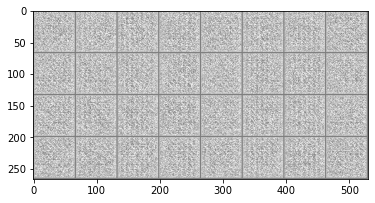

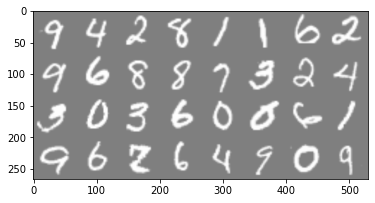

epoch [0/10]  batch 100/938\  loss D : 0.6622,   loss G: 2.7659    D(x): 0.8742


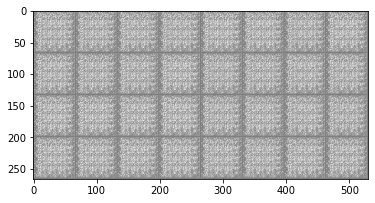

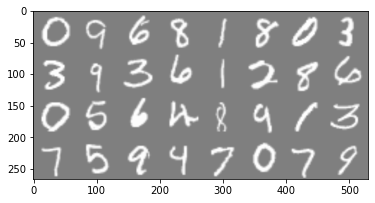

epoch [0/10]  batch 200/938\  loss D : 0.7059,   loss G: 3.4983    D(x): 0.8482


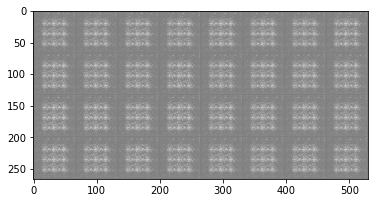

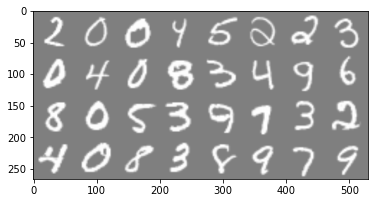

epoch [0/10]  batch 300/938\  loss D : 0.7895,   loss G: 2.7409    D(x): 0.8391


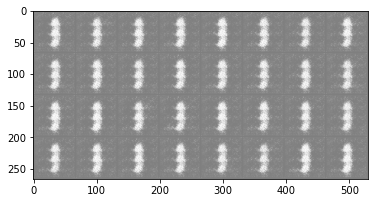

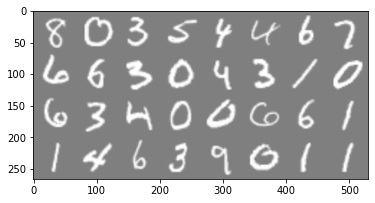

epoch [0/10]  batch 400/938\  loss D : 0.6712,   loss G: 2.6685    D(x): 0.8899


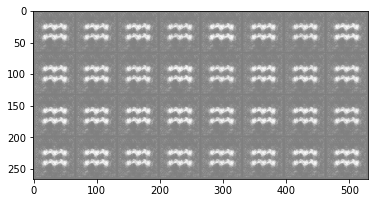

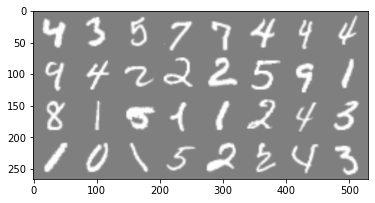

epoch [0/10]  batch 500/938\  loss D : 0.6611,   loss G: 2.5072    D(x): 0.8871


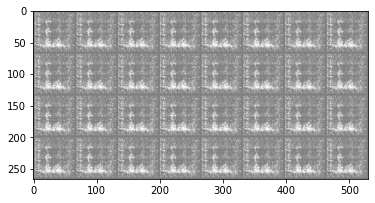

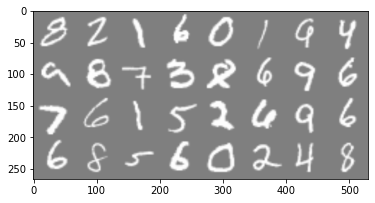

epoch [0/10]  batch 600/938\  loss D : 0.6597,   loss G: 2.4149    D(x): 0.8755


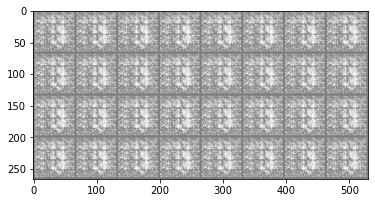

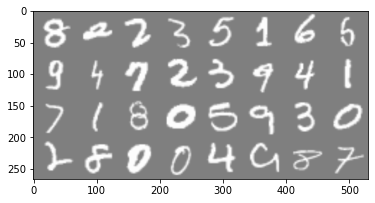

epoch [0/10]  batch 700/938\  loss D : 0.6737,   loss G: 2.7745    D(x): 0.9026


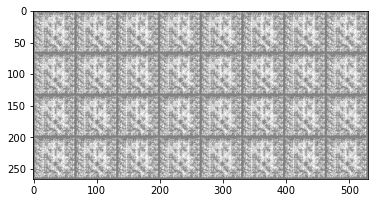

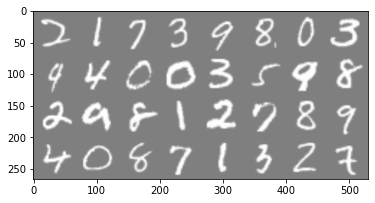

epoch [0/10]  batch 800/938\  loss D : 0.6562,   loss G: 2.1633    D(x): 0.8874


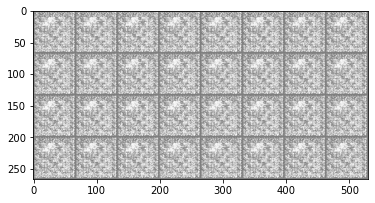

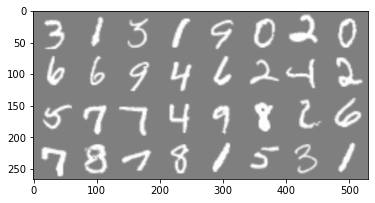

epoch [0/10]  batch 900/938\  loss D : 0.6542,   loss G: 2.5562    D(x): 0.8872


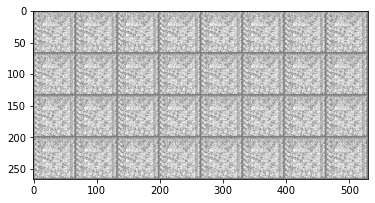

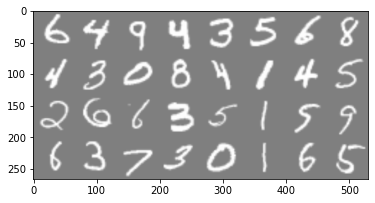

epoch [1/10]  batch 0/938\  loss D : 0.7019,   loss G: 3.9625    D(x): 0.9097


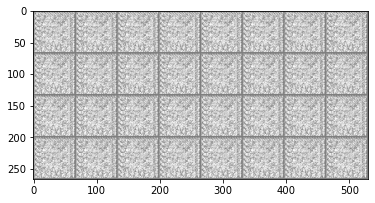

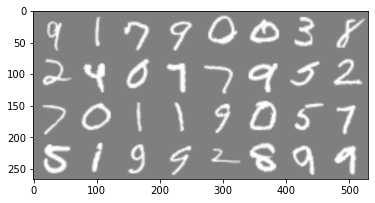

epoch [1/10]  batch 100/938\  loss D : 0.6535,   loss G: 2.2998    D(x): 0.9030


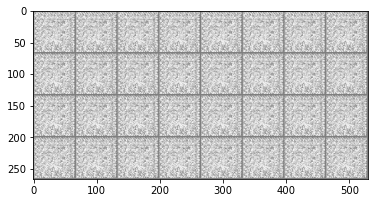

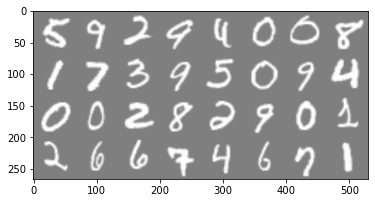

epoch [1/10]  batch 200/938\  loss D : 0.6516,   loss G: 2.3260    D(x): 0.9073


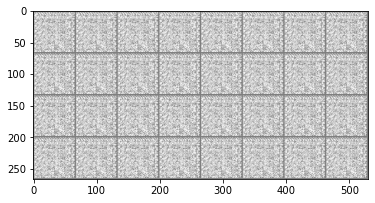

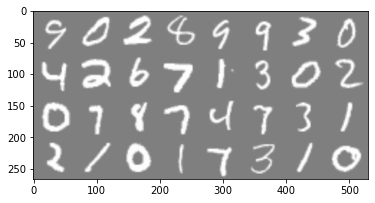

epoch [1/10]  batch 300/938\  loss D : 0.6534,   loss G: 2.4417    D(x): 0.8953


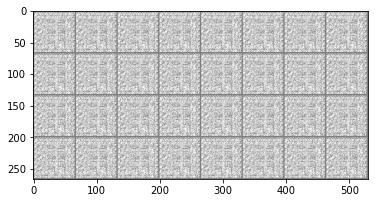

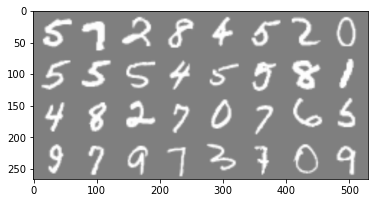

epoch [1/10]  batch 400/938\  loss D : 0.6518,   loss G: 2.2339    D(x): 0.9117


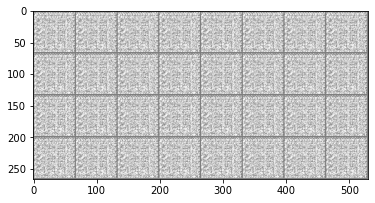

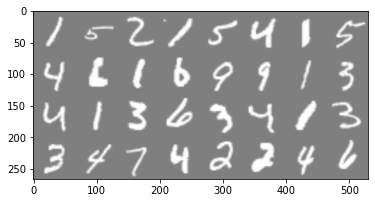

epoch [1/10]  batch 500/938\  loss D : 0.6520,   loss G: 2.3134    D(x): 0.8993


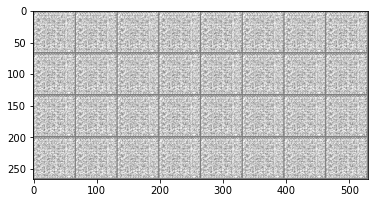

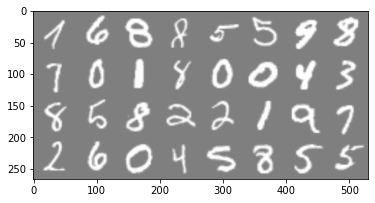

epoch [1/10]  batch 600/938\  loss D : 0.6516,   loss G: 2.2655    D(x): 0.8914


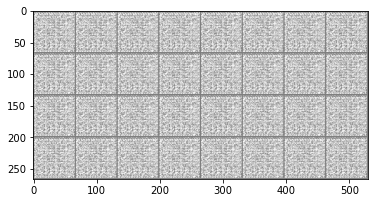

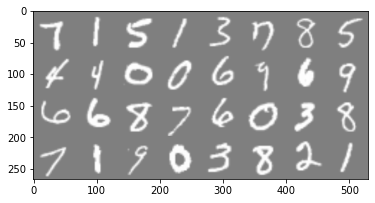

epoch [1/10]  batch 700/938\  loss D : 0.6510,   loss G: 2.3505    D(x): 0.8971


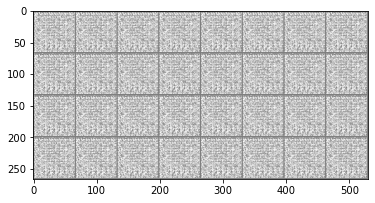

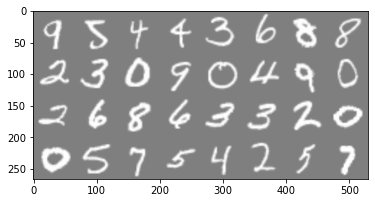

epoch [1/10]  batch 800/938\  loss D : 0.6509,   loss G: 2.0729    D(x): 0.8961


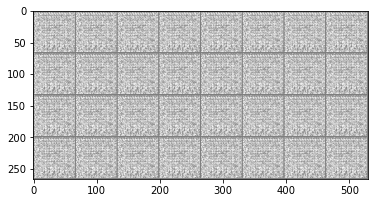

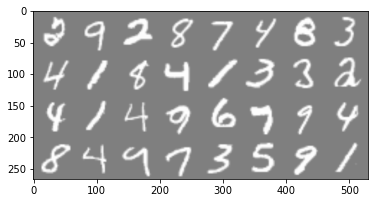

epoch [1/10]  batch 900/938\  loss D : 0.6610,   loss G: 2.2378    D(x): 0.8893


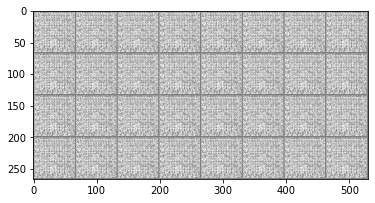

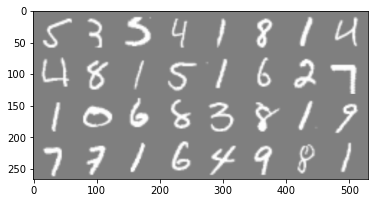

epoch [2/10]  batch 0/938\  loss D : 0.6652,   loss G: 1.9346    D(x): 0.8836


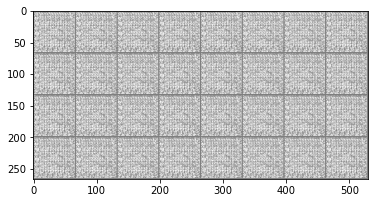

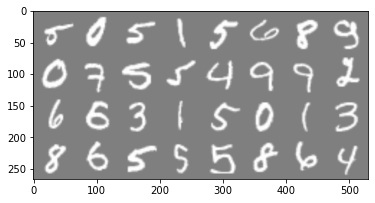

epoch [2/10]  batch 100/938\  loss D : 0.6507,   loss G: 2.3613    D(x): 0.9023


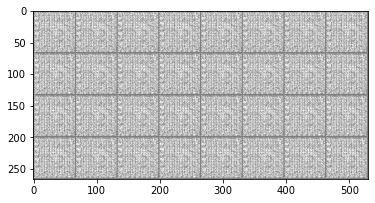

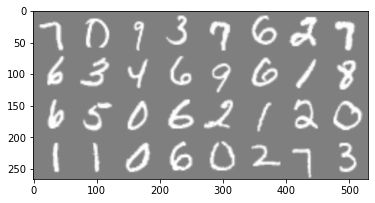

epoch [2/10]  batch 200/938\  loss D : 0.6784,   loss G: 2.2668    D(x): 0.8777


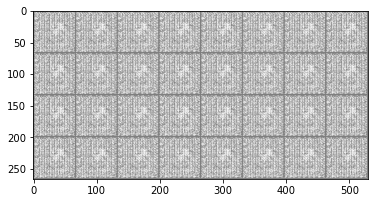

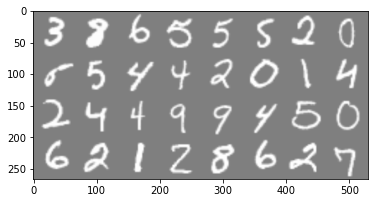

epoch [2/10]  batch 300/938\  loss D : 0.6508,   loss G: 2.3823    D(x): 0.8940


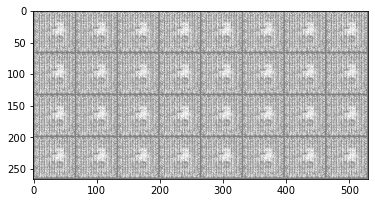

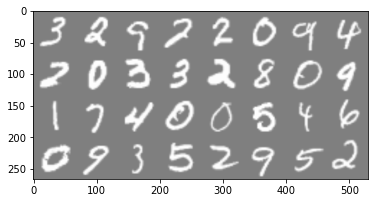

epoch [2/10]  batch 400/938\  loss D : 0.6618,   loss G: 2.1206    D(x): 0.8816


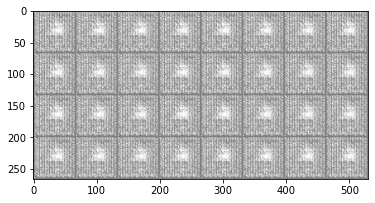

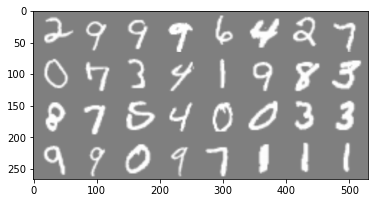

epoch [2/10]  batch 500/938\  loss D : 0.7269,   loss G: 2.5051    D(x): 0.8319


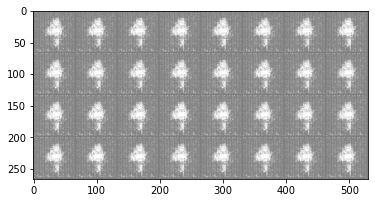

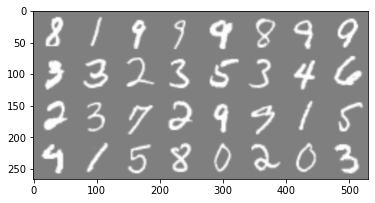

epoch [2/10]  batch 600/938\  loss D : 0.7929,   loss G: 3.2275    D(x): 0.8335


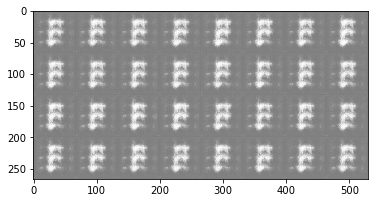

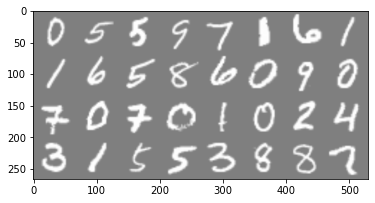

epoch [2/10]  batch 700/938\  loss D : 1.6431,   loss G: 1.3459    D(x): 0.3406


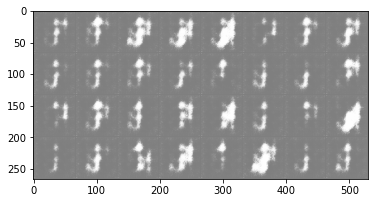

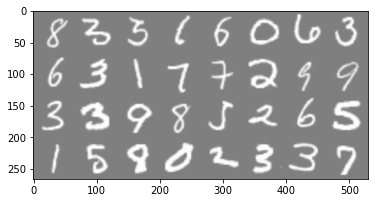

epoch [2/10]  batch 800/938\  loss D : 0.7190,   loss G: 1.4328    D(x): 0.7846


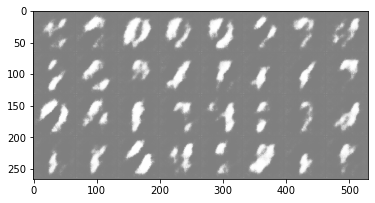

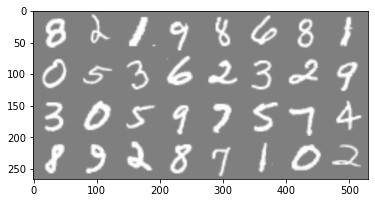

epoch [2/10]  batch 900/938\  loss D : 0.9104,   loss G: 2.7221    D(x): 0.9069


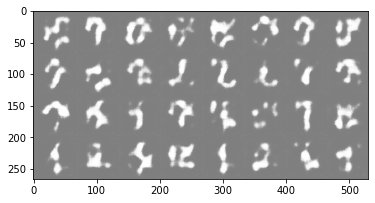

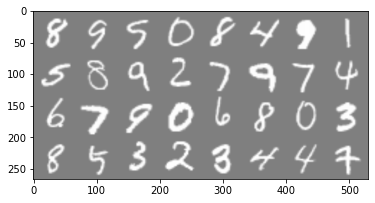

epoch [3/10]  batch 0/938\  loss D : 0.7905,   loss G: 1.7577    D(x): 0.7388


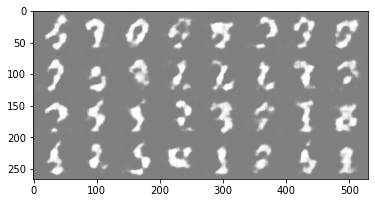

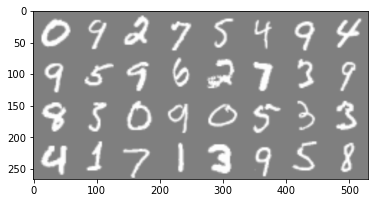

epoch [3/10]  batch 100/938\  loss D : 0.6933,   loss G: 1.5988    D(x): 0.8261


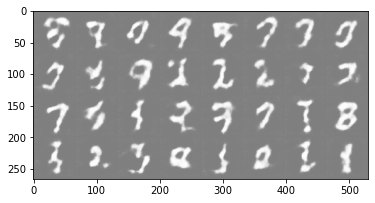

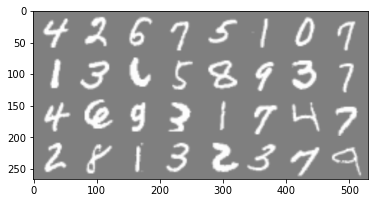

epoch [3/10]  batch 200/938\  loss D : 0.7397,   loss G: 1.6761    D(x): 0.7988


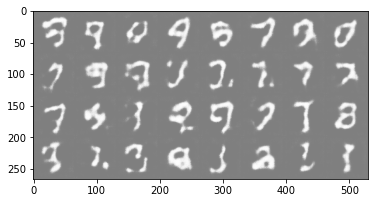

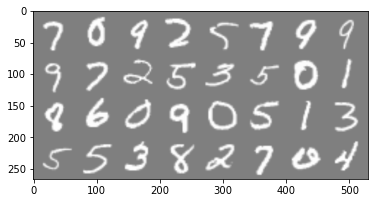

epoch [3/10]  batch 300/938\  loss D : 0.8634,   loss G: 1.3152    D(x): 0.6361


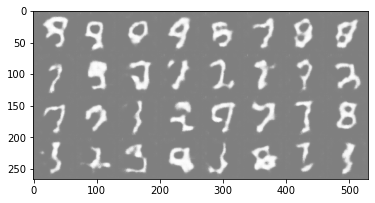

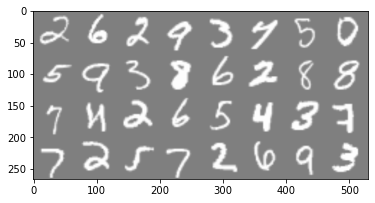

epoch [3/10]  batch 400/938\  loss D : 0.8876,   loss G: 2.5808    D(x): 0.9182


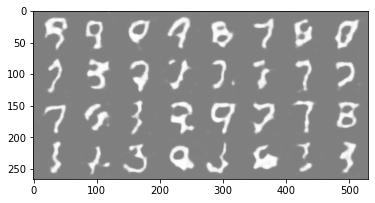

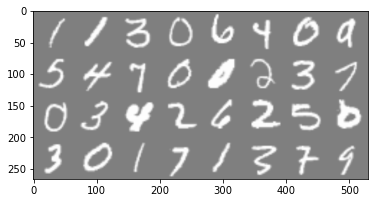

epoch [3/10]  batch 500/938\  loss D : 0.8024,   loss G: 2.7417    D(x): 0.8933


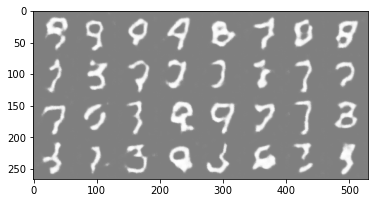

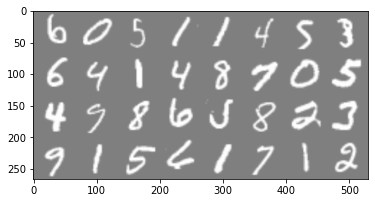

epoch [3/10]  batch 600/938\  loss D : 0.7467,   loss G: 2.0587    D(x): 0.8583


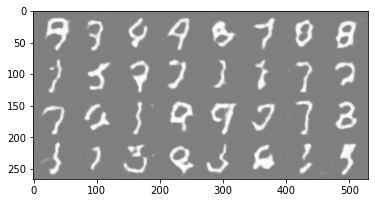

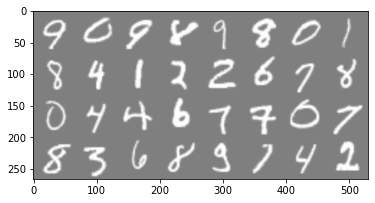

epoch [3/10]  batch 700/938\  loss D : 0.7682,   loss G: 1.4010    D(x): 0.7790


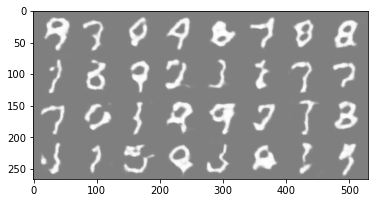

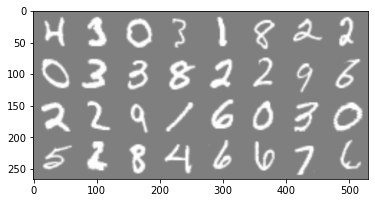

epoch [3/10]  batch 800/938\  loss D : 1.1895,   loss G: 2.9057    D(x): 0.9486


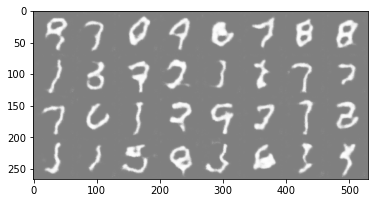

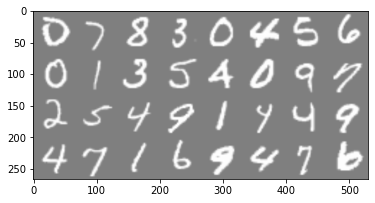

epoch [3/10]  batch 900/938\  loss D : 0.8826,   loss G: 2.8594    D(x): 0.9453


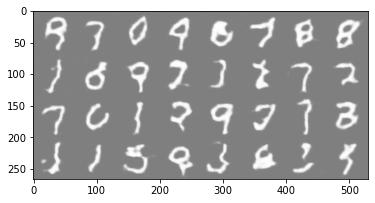

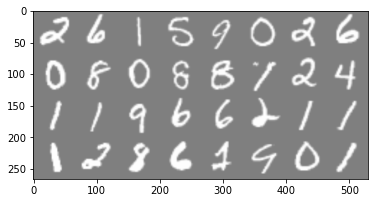

epoch [4/10]  batch 0/938\  loss D : 1.1322,   loss G: 0.5703    D(x): 0.4626


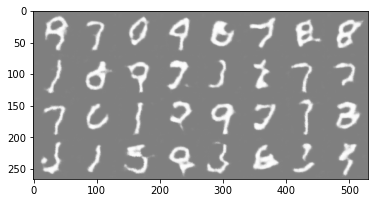

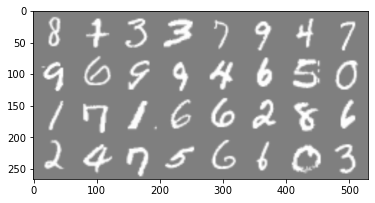

epoch [4/10]  batch 100/938\  loss D : 0.6920,   loss G: 2.1985    D(x): 0.8690


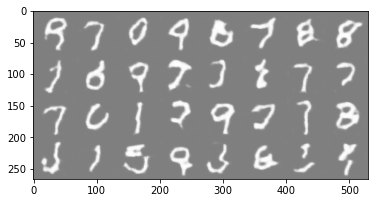

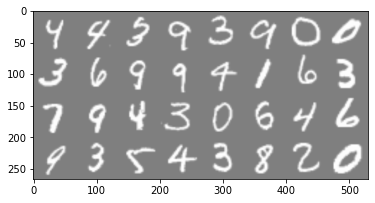

epoch [4/10]  batch 200/938\  loss D : 0.7335,   loss G: 1.3298    D(x): 0.7756


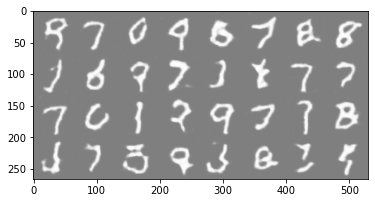

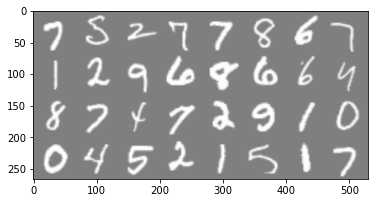

epoch [4/10]  batch 300/938\  loss D : 0.7863,   loss G: 1.3210    D(x): 0.7161


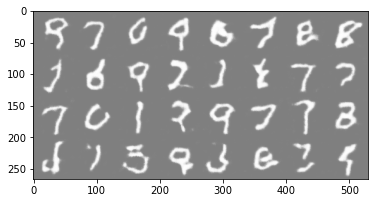

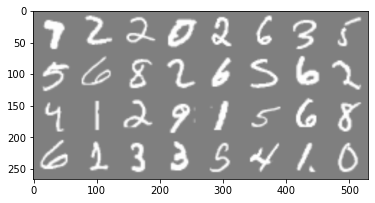

epoch [4/10]  batch 400/938\  loss D : 0.8067,   loss G: 2.2087    D(x): 0.8835


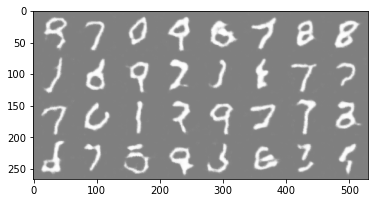

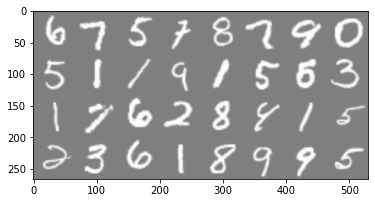

epoch [4/10]  batch 500/938\  loss D : 0.7930,   loss G: 2.1562    D(x): 0.8660


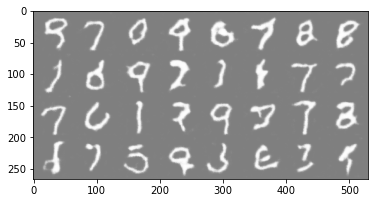

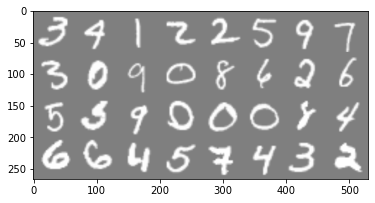

epoch [4/10]  batch 600/938\  loss D : 0.7310,   loss G: 1.5724    D(x): 0.7991


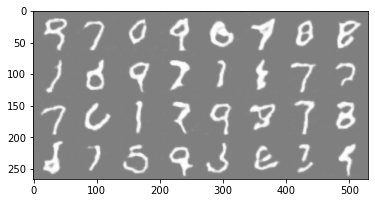

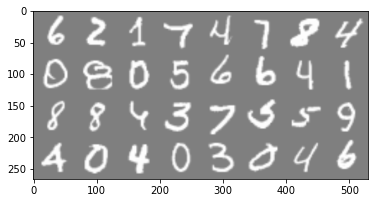

epoch [4/10]  batch 700/938\  loss D : 0.8768,   loss G: 2.6410    D(x): 0.9193


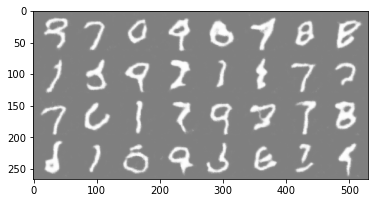

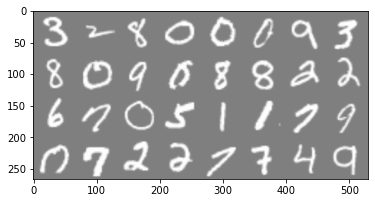

epoch [4/10]  batch 800/938\  loss D : 0.7807,   loss G: 1.7535    D(x): 0.8669


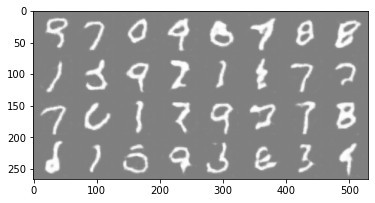

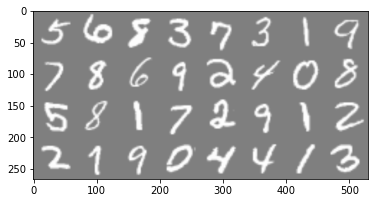

epoch [4/10]  batch 900/938\  loss D : 0.7179,   loss G: 1.9178    D(x): 0.8743


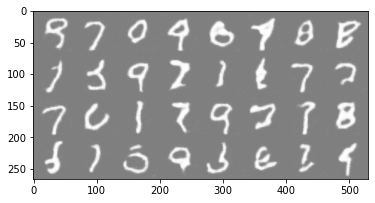

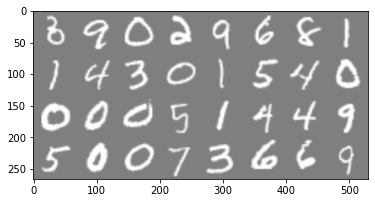

epoch [5/10]  batch 0/938\  loss D : 0.7192,   loss G: 1.9275    D(x): 0.8554


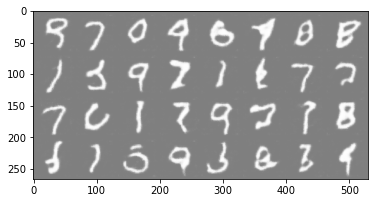

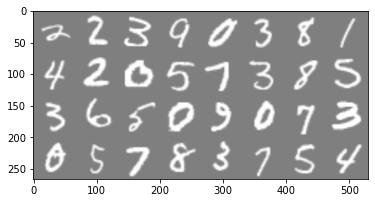

epoch [5/10]  batch 100/938\  loss D : 1.0370,   loss G: 0.8237    D(x): 0.5291


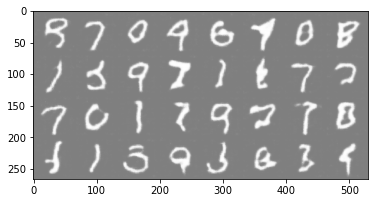

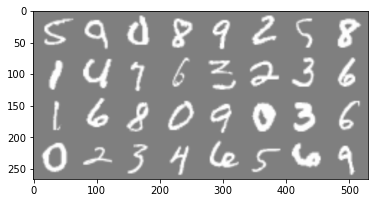

epoch [5/10]  batch 200/938\  loss D : 1.2445,   loss G: 1.8586    D(x): 0.4257


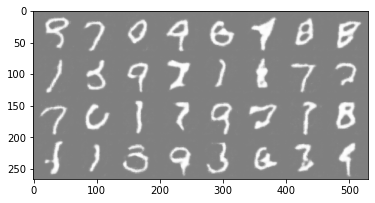

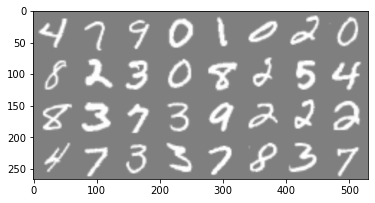

epoch [5/10]  batch 300/938\  loss D : 0.7517,   loss G: 2.3791    D(x): 0.8843


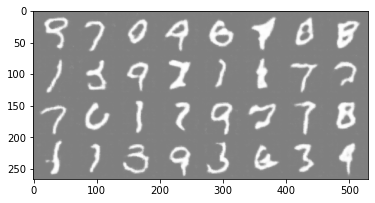

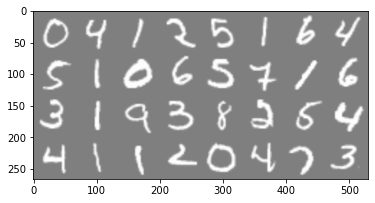

epoch [5/10]  batch 400/938\  loss D : 0.7146,   loss G: 1.9386    D(x): 0.8481


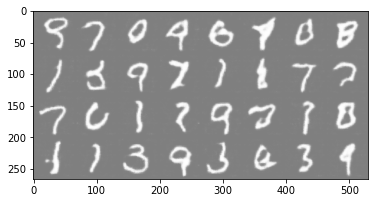

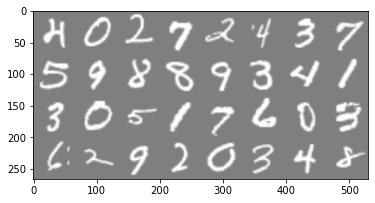

epoch [5/10]  batch 500/938\  loss D : 0.6937,   loss G: 1.8795    D(x): 0.8398


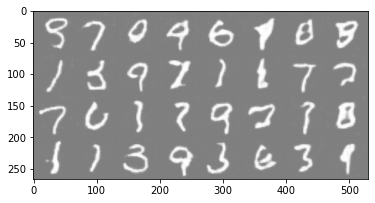

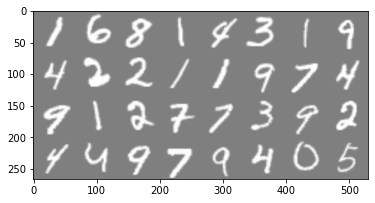

epoch [5/10]  batch 600/938\  loss D : 0.7681,   loss G: 2.7396    D(x): 0.9167


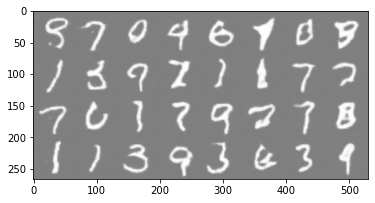

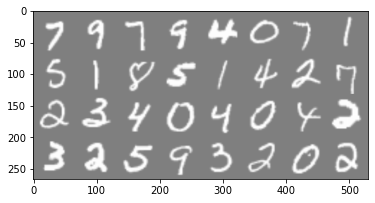

epoch [5/10]  batch 700/938\  loss D : 0.7410,   loss G: 2.4652    D(x): 0.8993


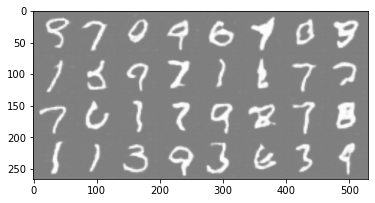

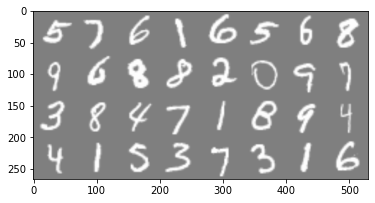

epoch [5/10]  batch 800/938\  loss D : 0.7453,   loss G: 2.1400    D(x): 0.8165


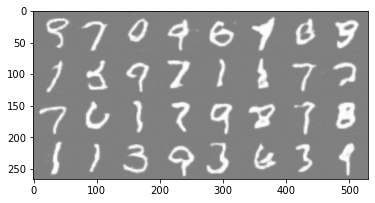

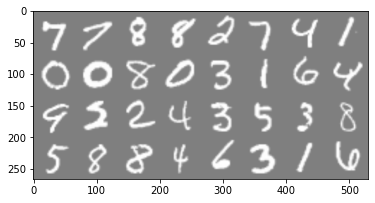

epoch [5/10]  batch 900/938\  loss D : 0.7043,   loss G: 2.0393    D(x): 0.8190


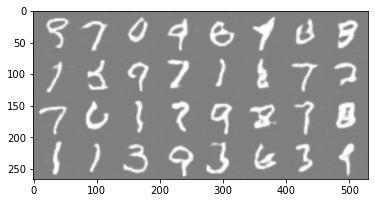

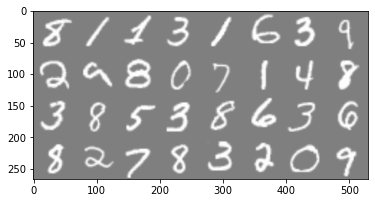

epoch [6/10]  batch 0/938\  loss D : 0.8616,   loss G: 1.2690    D(x): 0.6729


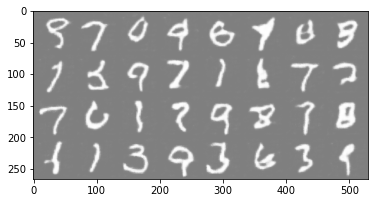

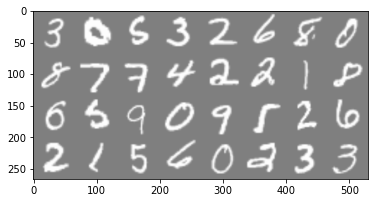

epoch [6/10]  batch 100/938\  loss D : 0.8127,   loss G: 2.7410    D(x): 0.9120


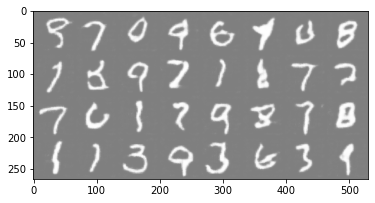

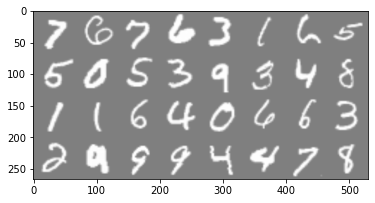

epoch [6/10]  batch 200/938\  loss D : 0.7763,   loss G: 2.5498    D(x): 0.8750


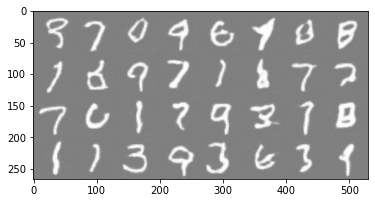

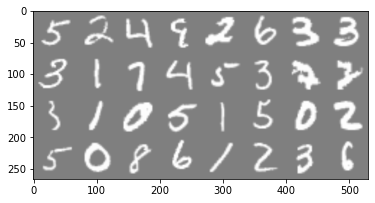

epoch [6/10]  batch 300/938\  loss D : 0.7406,   loss G: 1.2414    D(x): 0.7616


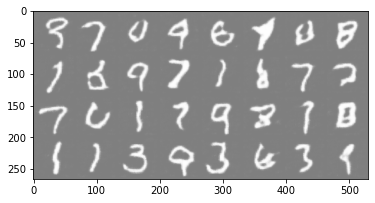

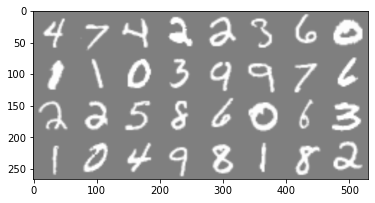

epoch [6/10]  batch 400/938\  loss D : 0.6981,   loss G: 2.1685    D(x): 0.8755


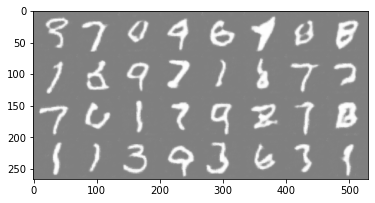

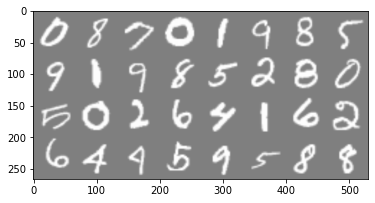

epoch [6/10]  batch 500/938\  loss D : 0.7333,   loss G: 1.7224    D(x): 0.7748


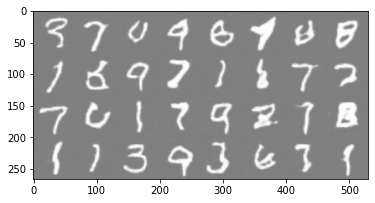

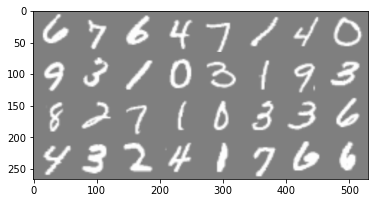

epoch [6/10]  batch 600/938\  loss D : 0.7482,   loss G: 2.6663    D(x): 0.9227


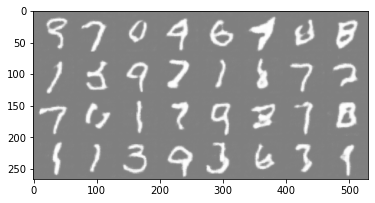

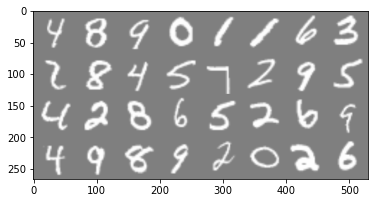

epoch [6/10]  batch 700/938\  loss D : 0.7104,   loss G: 1.8690    D(x): 0.7941


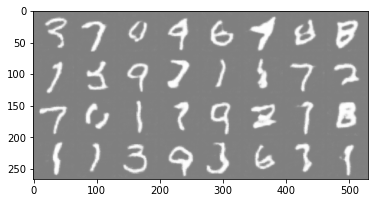

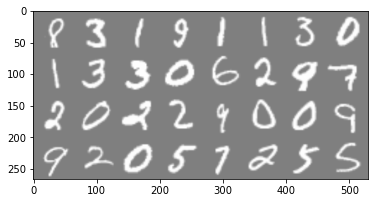

epoch [6/10]  batch 800/938\  loss D : 0.7266,   loss G: 1.4817    D(x): 0.7999


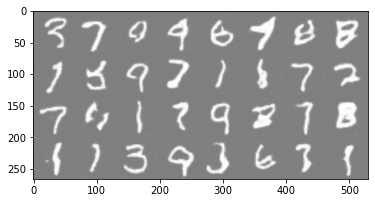

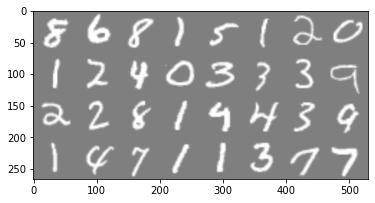

epoch [6/10]  batch 900/938\  loss D : 0.7218,   loss G: 1.9080    D(x): 0.8335


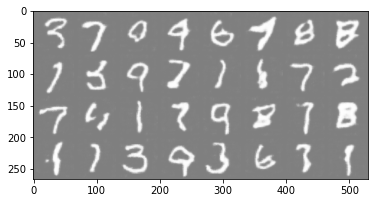

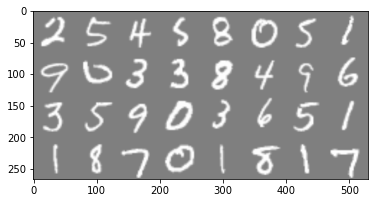

epoch [7/10]  batch 0/938\  loss D : 0.7067,   loss G: 2.2253    D(x): 0.8887


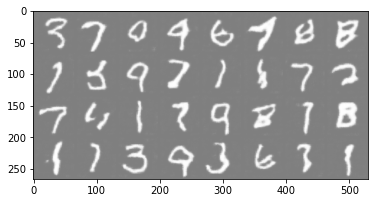

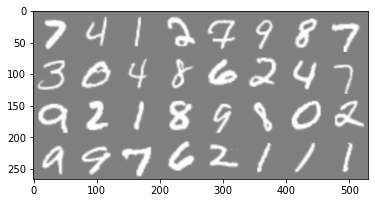

epoch [7/10]  batch 100/938\  loss D : 0.9040,   loss G: 3.1082    D(x): 0.9521


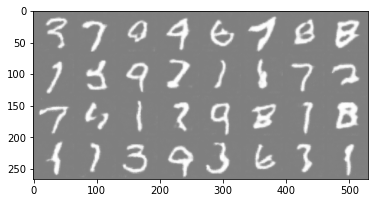

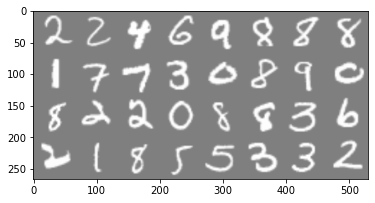

epoch [7/10]  batch 200/938\  loss D : 0.8916,   loss G: 1.0818    D(x): 0.6835


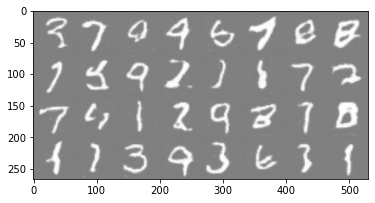

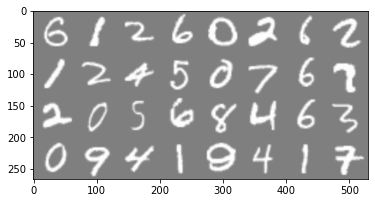

epoch [7/10]  batch 300/938\  loss D : 0.8146,   loss G: 3.2530    D(x): 0.9385


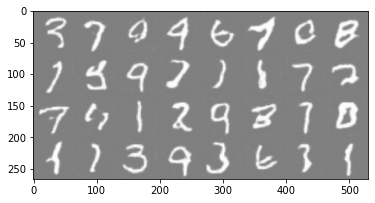

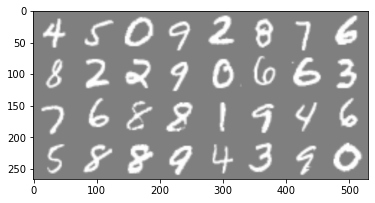

epoch [7/10]  batch 400/938\  loss D : 0.7425,   loss G: 1.8148    D(x): 0.7832


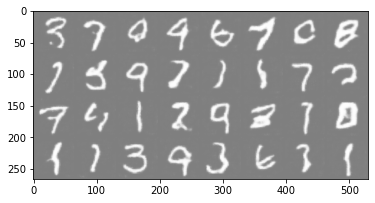

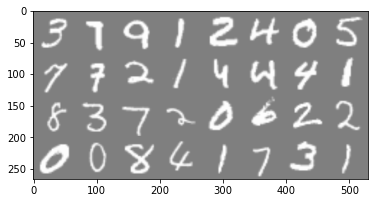

epoch [7/10]  batch 500/938\  loss D : 0.7193,   loss G: 2.1674    D(x): 0.8658


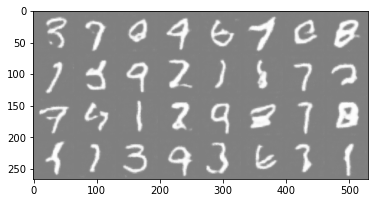

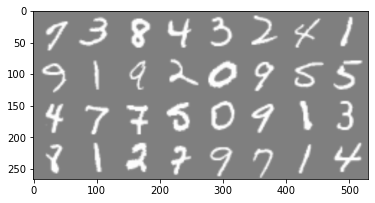

epoch [7/10]  batch 600/938\  loss D : 0.7772,   loss G: 1.8095    D(x): 0.7944


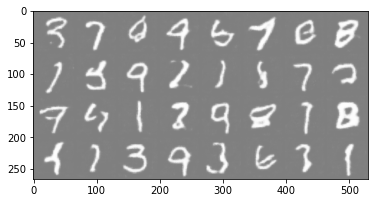

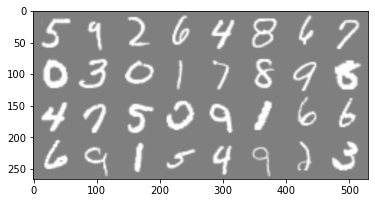

epoch [7/10]  batch 700/938\  loss D : 0.7024,   loss G: 2.3135    D(x): 0.8523


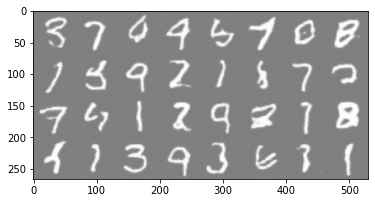

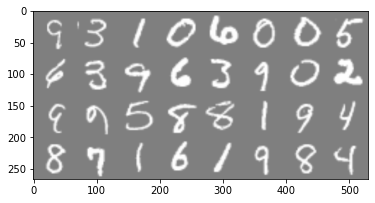

epoch [7/10]  batch 800/938\  loss D : 0.7270,   loss G: 2.0168    D(x): 0.7823


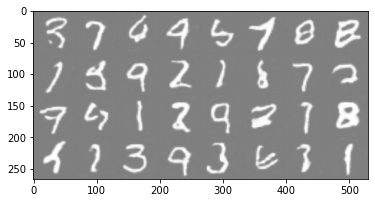

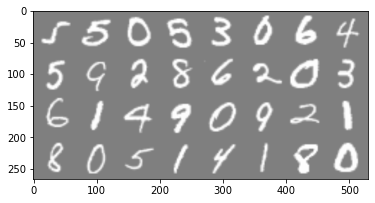

epoch [7/10]  batch 900/938\  loss D : 0.7284,   loss G: 2.3770    D(x): 0.9099


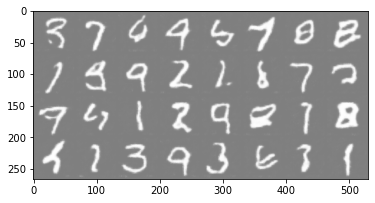

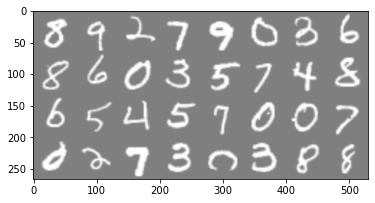

epoch [8/10]  batch 0/938\  loss D : 0.6847,   loss G: 2.0783    D(x): 0.8395


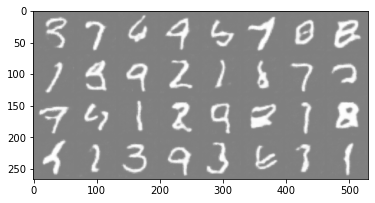

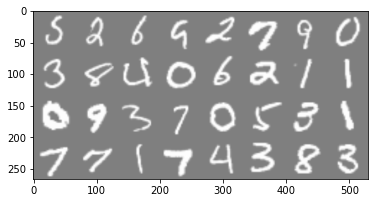

epoch [8/10]  batch 100/938\  loss D : 0.7143,   loss G: 2.3437    D(x): 0.8027


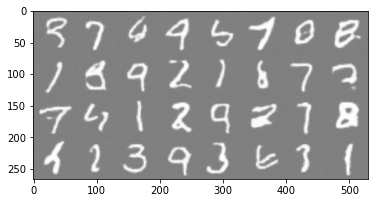

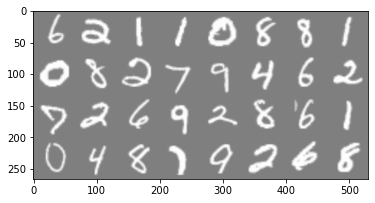

epoch [8/10]  batch 200/938\  loss D : 0.6977,   loss G: 2.1852    D(x): 0.8206


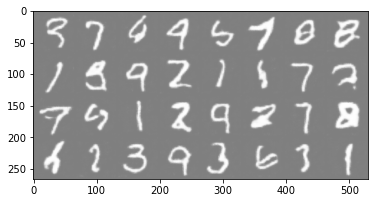

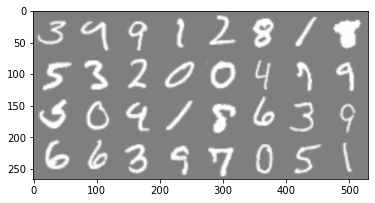

epoch [8/10]  batch 300/938\  loss D : 0.6888,   loss G: 2.1908    D(x): 0.8432


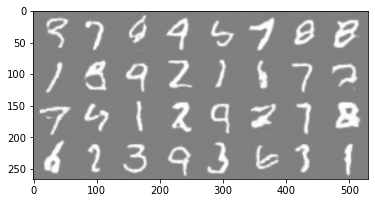

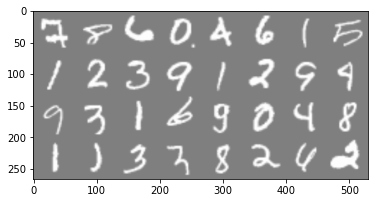

epoch [8/10]  batch 400/938\  loss D : 0.7434,   loss G: 2.9385    D(x): 0.9316


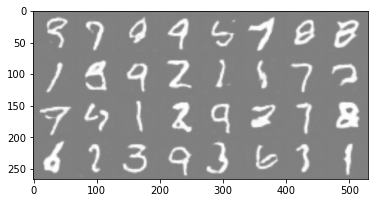

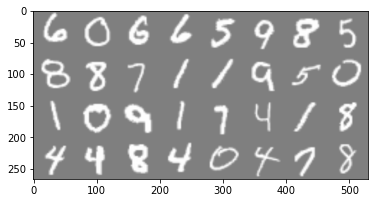

epoch [8/10]  batch 500/938\  loss D : 0.6919,   loss G: 1.8977    D(x): 0.8294


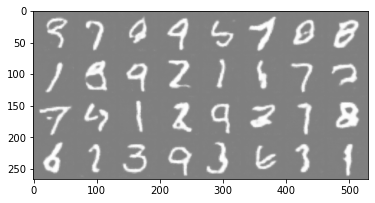

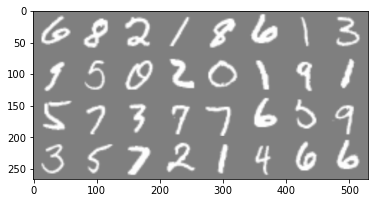

epoch [8/10]  batch 600/938\  loss D : 0.7539,   loss G: 1.8313    D(x): 0.8788


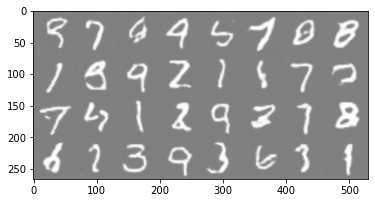

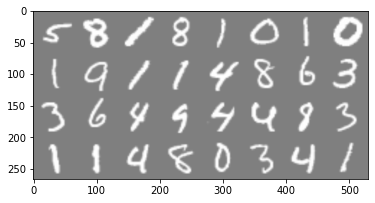

epoch [8/10]  batch 700/938\  loss D : 0.6784,   loss G: 2.5680    D(x): 0.8990


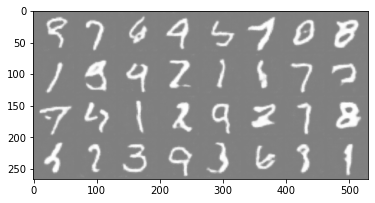

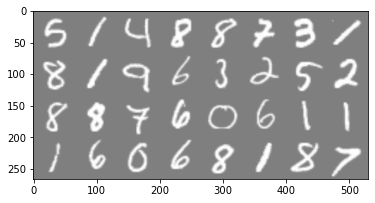

epoch [8/10]  batch 800/938\  loss D : 0.6850,   loss G: 2.1165    D(x): 0.8550


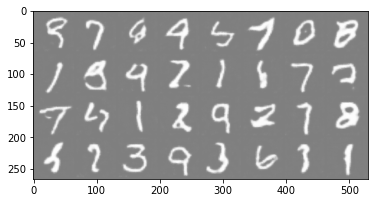

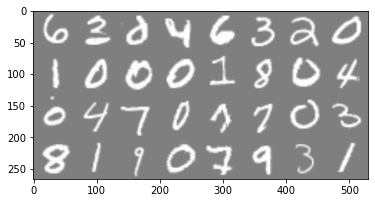

epoch [8/10]  batch 900/938\  loss D : 0.6888,   loss G: 1.9943    D(x): 0.8550


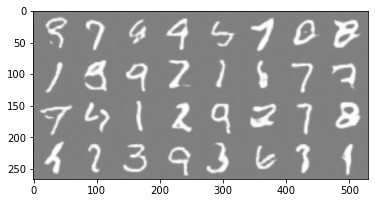

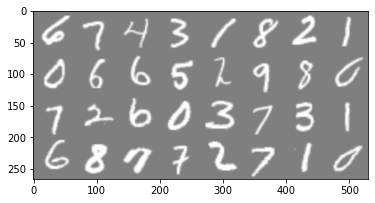

epoch [9/10]  batch 0/938\  loss D : 0.7097,   loss G: 1.7149    D(x): 0.8155


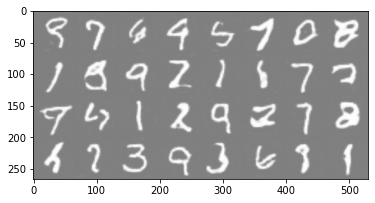

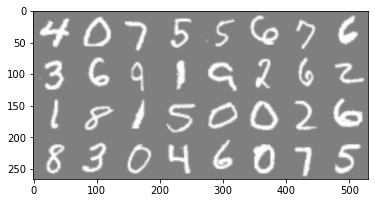

epoch [9/10]  batch 100/938\  loss D : 0.7540,   loss G: 2.4564    D(x): 0.8681


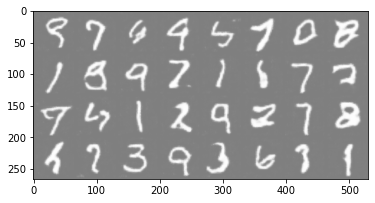

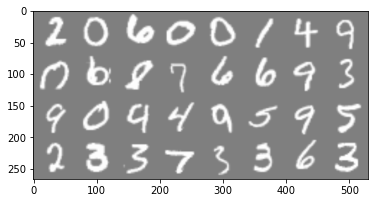

epoch [9/10]  batch 200/938\  loss D : 0.7153,   loss G: 1.6107    D(x): 0.8070


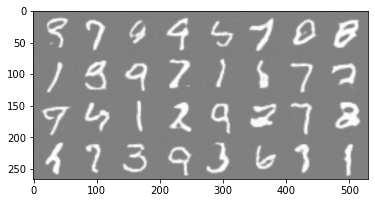

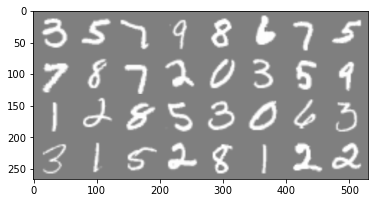

epoch [9/10]  batch 300/938\  loss D : 0.7030,   loss G: 2.0768    D(x): 0.8443


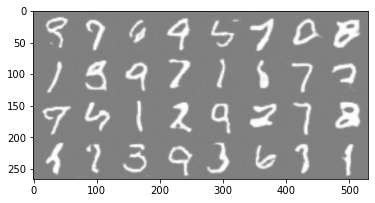

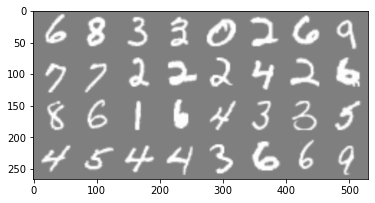

epoch [9/10]  batch 400/938\  loss D : 0.8233,   loss G: 1.6074    D(x): 0.6976


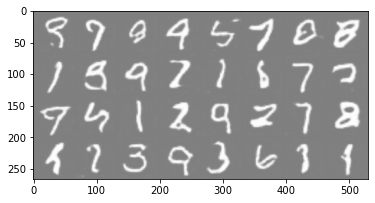

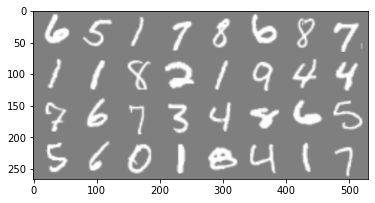

epoch [9/10]  batch 500/938\  loss D : 0.7055,   loss G: 2.5827    D(x): 0.9087


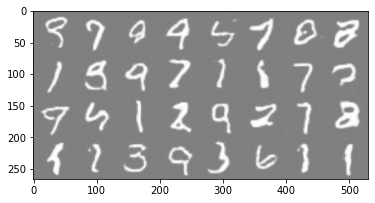

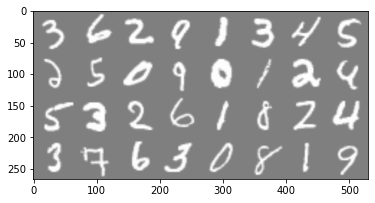

epoch [9/10]  batch 600/938\  loss D : 0.6782,   loss G: 2.4228    D(x): 0.8794


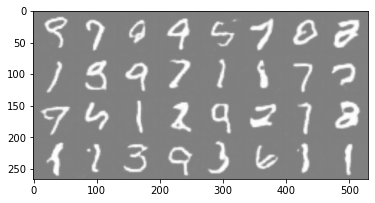

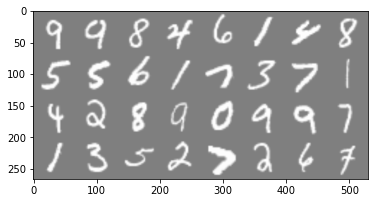

epoch [9/10]  batch 700/938\  loss D : 0.6835,   loss G: 2.8044    D(x): 0.9027


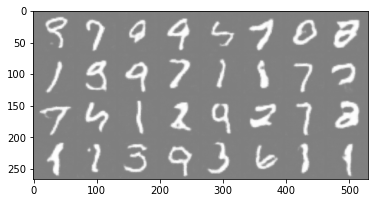

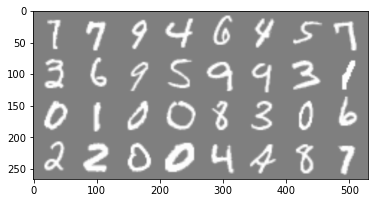

epoch [9/10]  batch 800/938\  loss D : 0.6901,   loss G: 2.2441    D(x): 0.8887


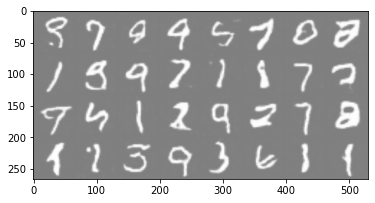

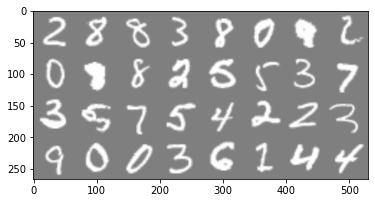

epoch [9/10]  batch 900/938\  loss D : 0.6947,   loss G: 2.1300    D(x): 0.8287


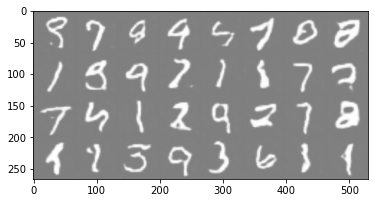

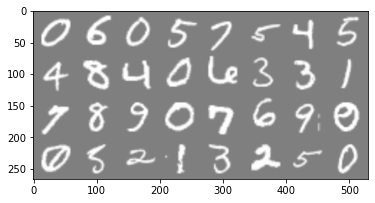

In [6]:
lr=0.0002
batch_size=64
image_size=64
channels_img=1
channel_noise=256
num_epochs=10

features_d=16
features_g=16
# print(features_g*8)
my_transform=transforms.Compose([
  transforms.Resize(image_size),
  transforms.ToTensor(),
  transforms.Normalize((0.5,),(0.5,)),
  ])

dataset=datasets.MNIST(root='dataset/',train=True,transform=my_transform,download=True)
# print(dataset)
dataloader=DataLoader(dataset,batch_size=batch_size,shuffle=True)

device=torch.device("cuda" if torch.cuda.is_available() else "cpu")

netD=Discriminator(channels_img,features_d).to(device)
netG=Generator(channel_noise,channels_img,features_g).to(device)

optimizerD=optim.Adam(netD.parameters(),lr=lr,betas=(0.5,0.999))
optimizerG=optim.Adam(netG.parameters(),lr=lr,betas=(0.5,0.999))

netG.train()
netD.train()

criterion=nn.BCELoss()

real_label=1
fake_label=0

fixed_noise=torch.randn(64,channel_noise,1,1).to(device)
writer_real=SummaryWriter(f'runs/DCGAN_MNIST/test_real')
writer_fake=SummaryWriter(f'runs/DCGAN_MNIST/test_fake')
step=0

print("Training")

for epoch in range(num_epochs):
  for batch_idx,(data,targets) in enumerate(dataloader):
    # print(data.shape,targets)
    data=data.to(device)
    batch_size=data.shape[0]

    netD.zero_grad()
    label=(torch.ones(batch_size)*0.9).to(device)
    output=netD(data).reshape(-1)
    lossD_real=criterion(output,label)
    D_x=output.mean().item()

    noise=torch.randn(batch_size,channel_noise,1,1).to(device)
    fake=netG(noise)
    label=(torch.ones(batch_size)*0.1).to(device)

    output=netD(fake.detach()).reshape(-1)
    lossD_fake=criterion(output,label)

    lossD=lossD_real+lossD_fake
    lossD.backward()
    optimizerD.step()

    netG.zero_grad()
    label=torch.ones(batch_size).to(device)
    output=netD(fake).reshape(-1)
    lossG=criterion(output,label)
    lossG.backward()
    optimizerG.step()

    if batch_idx%100==0:
      step+=1
      print(f'epoch [{epoch}/{num_epochs}]  batch {batch_idx}/{len(dataloader)}\  loss D : {lossD:.4f},   loss G: {lossG:.4f}    D(x): {D_x:.4f}')
      with torch.no_grad():
         fake=netG(fixed_noise)

         image_grid_real=torchvision.utils.make_grid(data[:32],normalize=True)
         image_grid_fake=torchvision.utils.make_grid(fake[:32],normalize=True)
         imshow(image_grid_fake)
         imshow(image_grid_real)
         writer_real.add_image("mnist  real images",image_grid_real,global_step=step)
         writer_fake.add_image("mnsit fake images",image_grid_fake,global_step=step)
